### 1. Se pide: (regression)

A partir del archivo "USA_Housing.csv", realizar la regresión no lineal entre cada columna numérica con la columna 'price' utilizando:

- SVR

In [14]:
import pandas as pd

df = pd.read_csv("../data/USA_Housing.csv")
df

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price,Address
0,79545.458574,5.682861,7.009188,4.09,23086.800503,1.059034e+06,"208 Michael Ferry Apt. 674\r\nLaurabury, NE 37..."
1,79248.642455,6.002900,6.730821,3.09,40173.072174,1.505891e+06,"188 Johnson Views Suite 079\r\nLake Kathleen, ..."
2,61287.067179,5.865890,8.512727,5.13,36882.159400,1.058988e+06,"9127 Elizabeth Stravenue\r\nDanieltown, WI 064..."
3,63345.240046,7.188236,5.586729,3.26,34310.242831,1.260617e+06,USS Barnett\r\nFPO AP 44820
4,59982.197226,5.040555,7.839388,4.23,26354.109472,6.309435e+05,USNS Raymond\r\nFPO AE 09386
...,...,...,...,...,...,...,...
4995,60567.944140,7.830362,6.137356,3.46,22837.361035,1.060194e+06,USNS Williams\r\nFPO AP 30153-7653
4996,78491.275435,6.999135,6.576763,4.02,25616.115489,1.482618e+06,"PSC 9258, Box 8489\r\nAPO AA 42991-3352"
4997,63390.686886,7.250591,4.805081,2.13,33266.145490,1.030730e+06,"4215 Tracy Garden Suite 076\r\nJoshualand, VA ..."
4998,68001.331235,5.534388,7.130144,5.44,42625.620156,1.198657e+06,USS Wallace\r\nFPO AE 73316


In [15]:
import numpy as np
from sklearn.svm import SVR
import matplotlib.pyplot as plt

In [16]:
for i in range(len(df.dtypes)):
    if df.dtypes[i] == 'float64':
        print(df.keys()[i])

Avg. Area Income
Avg. Area House Age
Avg. Area Number of Rooms
Avg. Area Number of Bedrooms
Area Population
Price


Avg. Area Income
model.score: 0.0005268425100430907


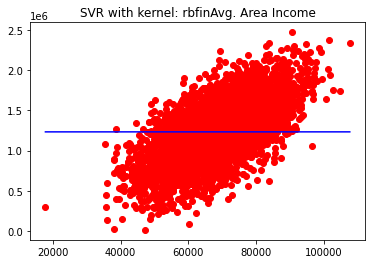

Avg. Area House Age
model.score: 0.0470163337406847


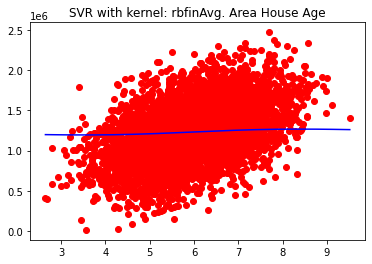

Avg. Area Number of Rooms
model.score: 0.02549819055278979


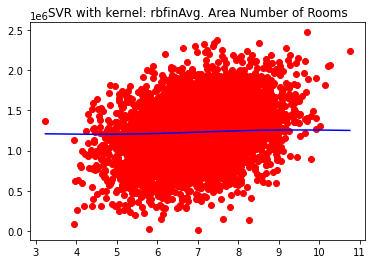

Avg. Area Number of Bedrooms
model.score: 0.008258993113685054


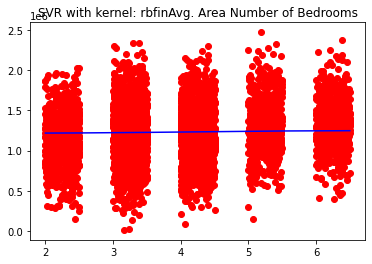

Area Population
model.score: 0.0004912665470143684


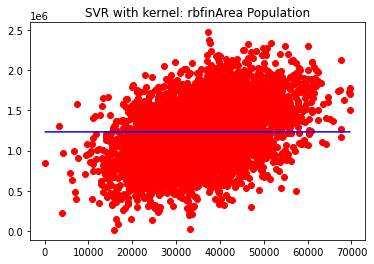

In [4]:
for i in range(len(df.dtypes)):
    if df.dtypes[i] == 'float64' and df.keys()[i] != 'Price':
        print(df.keys()[i])
        # regresión no lineal para Avg. Area Income
        y = np.array(df['Price'])
        X = np.array(df[df.keys()[i]]).reshape(-1,1)
        kernel = ['rbf']
        for elem in kernel:
            svr_rbf = SVR(kernel=elem, C=100, gamma=0.1, epsilon=.1)
            model = svr_rbf.fit(X, y)
            print("model.score:", model.score(X, y))
            y_prediction = model.predict(X)

            X_train_to_show, y_train_to_show = zip(*sorted(zip(X, y)))
            plt.scatter(X_train_to_show, y_train_to_show, color='red')
            X_train_to_show, y_pred = zip(*sorted(zip(X, y_prediction)))
            plt.plot(X_train_to_show, y_pred, color='blue')
            plt.title("SVR with kernel: " + str(elem) + 'in' + df.keys()[i])
            plt.show()

### 2. Se pide: (classification)

En el anterior dataset, la columna "Avg. Area Number of Bedrooms" está en un rango numérico limitado:

1. Cambia todos los datos para que sean enteros redondeando hacia el entero más cercano. Si es .5 exacto, se redondea hacia abajo.

2. Cuando lo hayas hecho, tendrás una columna con números enteros en un rango limitado. Ahora trata a esa columna como una serie de valores discretos (classes, labels). 

3. Usando las demás columnas numéricas y una a una, utiliza SVM (SVC) para clasificar esa columna modificada.

4. Usando todas las demás columnas a la vez ¿hace aumentar el score? ¿por qué? 

No, seguramente debido a que no hay correlación posible entre las columnas input y la target.

5. ¿Qué columna tiene mejor correlación con "Avg. Area Number of Bedrooms" una vez modificada? ¿qué columna da mejor score para nuestro target? 

La mejor correlación (0'3042) es con la columna 'Avg. Area Number of Rooms', lo cual tiene sentido


In [17]:
df2 = df.copy()
df2['Avg. Area Number of Bedrooms2'] = df2['Avg. Area Number of Bedrooms'].apply(lambda x: int(x//1))
df2

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price,Address,Avg. Area Number of Bedrooms2
0,79545.458574,5.682861,7.009188,4.09,23086.800503,1.059034e+06,"208 Michael Ferry Apt. 674\r\nLaurabury, NE 37...",4
1,79248.642455,6.002900,6.730821,3.09,40173.072174,1.505891e+06,"188 Johnson Views Suite 079\r\nLake Kathleen, ...",3
2,61287.067179,5.865890,8.512727,5.13,36882.159400,1.058988e+06,"9127 Elizabeth Stravenue\r\nDanieltown, WI 064...",5
3,63345.240046,7.188236,5.586729,3.26,34310.242831,1.260617e+06,USS Barnett\r\nFPO AP 44820,3
4,59982.197226,5.040555,7.839388,4.23,26354.109472,6.309435e+05,USNS Raymond\r\nFPO AE 09386,4
...,...,...,...,...,...,...,...,...
4995,60567.944140,7.830362,6.137356,3.46,22837.361035,1.060194e+06,USNS Williams\r\nFPO AP 30153-7653,3
4996,78491.275435,6.999135,6.576763,4.02,25616.115489,1.482618e+06,"PSC 9258, Box 8489\r\nAPO AA 42991-3352",4
4997,63390.686886,7.250591,4.805081,2.13,33266.145490,1.030730e+06,"4215 Tracy Garden Suite 076\r\nJoshualand, VA ...",2
4998,68001.331235,5.534388,7.130144,5.44,42625.620156,1.198657e+06,USS Wallace\r\nFPO AE 73316,5


Avg. Area Income
model.score: 0.9816
--------------------------


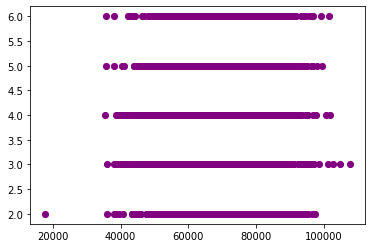

Avg. Area House Age
model.score: 0.3046
--------------------------


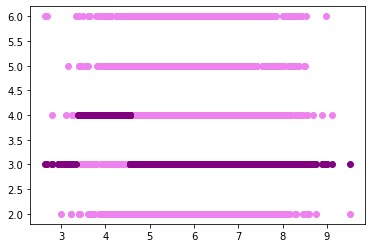

Avg. Area Number of Rooms
model.score: 0.3028
--------------------------


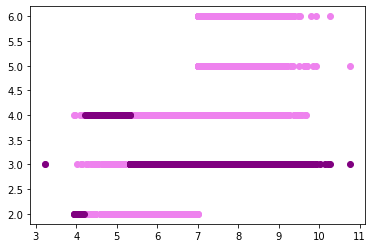

Avg. Area Number of Bedrooms
model.score: 1.0
--------------------------


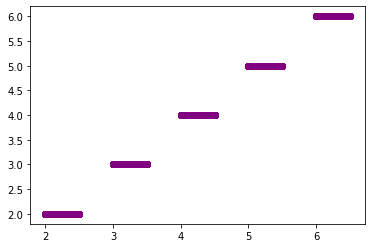

Area Population
model.score: 0.9784
--------------------------


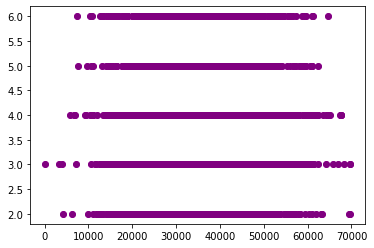

Price
model.score: 0.999
--------------------------


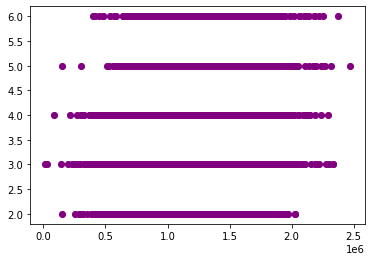

In [32]:
# El parámetro gamma = 0'1 devuelve unos valores de score que son muy cercanos al 1 para varios campos y no tiene coherencia con los resultados esperados.

from sklearn import svm
df2 = df.copy()
df2['Avg. Area Number of Bedrooms2'] = df2['Avg. Area Number of Bedrooms'].apply(lambda x: int(x//1))
df2
y2 = np.array(df2['Avg. Area Number of Bedrooms2'])

for i in range(len(df2.dtypes)):
    if df2.dtypes[i] == 'float64':
        print(df2.keys()[i])
        X2 = np.array(df2[df2.keys()[i]]).reshape(-1,1)
        svc_ins = svm.SVC(C=100, gamma=0.1, random_state=100)
        model_SVC = svc_ins.fit(X2, y2)
        print("model.score:", model_SVC.score(X2, y2))
        print("--------------------------")
        y2_prediction = model_SVC.predict(X2)

        plt.scatter(X2, y2, color='violet')
        plt.scatter(X2, y2_prediction, color='purple')
        plt.show()

Avg. Area Income
model.score: 0.3124
--------------------------


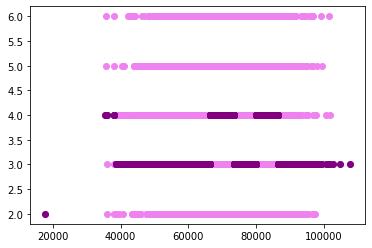

Avg. Area House Age
model.score: 0.3116
--------------------------


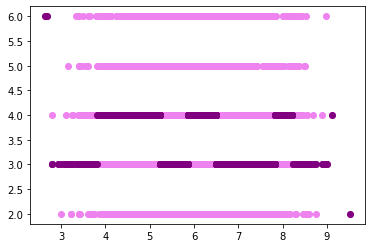

Avg. Area Number of Rooms
model.score: 0.31
--------------------------


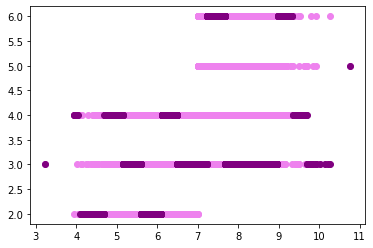

Avg. Area Number of Bedrooms
model.score: 1.0
--------------------------


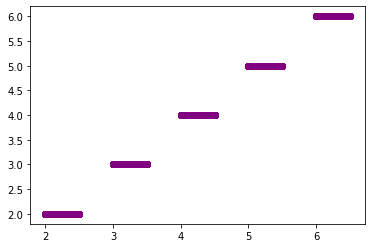

Area Population
model.score: 0.3072
--------------------------


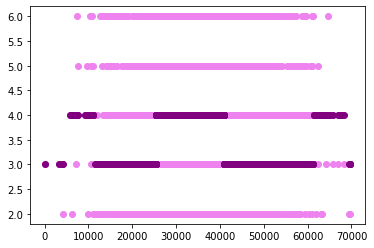

Price
model.score: 0.3038
--------------------------


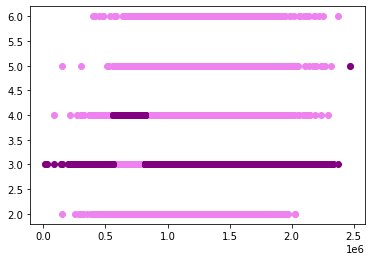

In [34]:
from sklearn import svm

y2 = np.array(df2['Avg. Area Number of Bedrooms2'])

for i in range(len(df2.dtypes)):
    if df2.dtypes[i] == 'float64':
        print(df2.keys()[i])
        X2 = np.array(df2[df2.keys()[i]]).reshape(-1,1)
        svc_ins = svm.SVC(C=100, random_state=100)
        model_SVC = svc_ins.fit(X2, y2)
        print("model.score:", model_SVC.score(X2, y2))
        print("--------------------------")
        y2_prediction = model_SVC.predict(X2)

        plt.scatter(X2, y2, color='violet')
        plt.scatter(X2, y2_prediction, color='purple')
        plt.show()

In [26]:
X3 = np.array(df2.drop(columns=['Avg. Area Number of Bedrooms','Address', 'Avg. Area Number of Bedrooms2']))
clf = svm.SVC(C=1)
clf.fit(X3, y2)
print ('score: '+ str(clf.score(X3, y2)) + " for C= 1")


score: 0.3016for C= 1


In [27]:
X3 = np.array(df2.drop(columns=['Avg. Area Number of Bedrooms','Address', 'Avg. Area Number of Bedrooms2']))
clf = svm.SVC(C=10)
clf.fit(X3, y2)
print ('score: '+ str(clf.score(X3, y2)) + " for C= 10")

score: 0.3016 for C= 1


In [29]:
X3 = np.array(df2.drop(columns=['Avg. Area Number of Bedrooms','Address', 'Avg. Area Number of Bedrooms2']))
clf = svm.SVC(C=100, gamma=0.1)
clf.fit(X3, y2)
print ('score: '+ str(clf.score(X3, y2)) + " for C= 100")

score: 1.0 for C= 100
